In [1]:
import numpy as np
import time as t
!pip install plotnine
from plotnine import *
import pandas as pd
import random as rd
import matplotlib.pyplot as plt


Defaulting to user installation because normal site-packages is not writeable
    pytz (>=2011n)
         ~~~~~~~^


In [2]:
df = pd.read_csv("/home/kyarish/Optimization/optimization-labs-2025/weight-height.csv")
df = df.apply(pd.to_numeric, errors='coerce')
X = np.array(df.iloc[:, 1:2].astype(float))[0:100]
Y = np.array(df.iloc[:, 2].astype(float))[0:100]
m = len(Y)


In [7]:
def calculate_objective(w):
    predictions = w[0] + X * w[1]
    loss = np.mean((Y - predictions) ** 2) / 2
    return loss


def calculate_gradient(w):
    predictions = w[0] + X * w[1]
    error = predictions - Y
    grad_w0 = np.mean(error)
    grad_w1 = np.mean(error * X)
    return np.array([grad_w0, grad_w1])


def gradient_descent(step: float, error=1e-4, max_iter=10_000_000):
    x = np.array([1, 1])
    objective_values = []
    time_start = t.time()
    for i in range(max_iter):
        grad = calculate_gradient(x)
        next_x = x - step * grad
        if i % 100 == 0:
            print(f"Iteration {i}, x = {x}", next_x)
        objective_values.append(calculate_objective(next_x))
        if (np.linalg.norm(grad) < error) or (np.linalg.norm(next_x) > 1e20):
            break
        x = next_x

    finish_time = t.time() - time_start
    return objective_values, finish_time, next_x
H = np.array([
    [1, np.mean(X)],
    [np.mean(X), np.mean(X ** 2)]
])

L = np.linalg.eigvalsh(H).max()


In [5]:
len(X)

100

In [ ]:
steps = [0.0001]
all_objective_values = pd.DataFrame(columns=['objective_value', 'iteration', 'step'])
for step in steps:
    objective_values, time, W = gradient_descent(step, max_iter=100_000_000)
    print(
        f'for step {step} it took {time} and itterations: {len(objective_values)} for this final result {objective_values[-1]}')
    temp_df = pd.DataFrame({
        'objective_value': objective_values,
        'iteration': np.arange(1, len(objective_values) + 1),
        'step': str(step)
    })

    all_objective_values = pd.concat([all_objective_values, temp_df], ignore_index=True)
w0 = W[0]
w1 = W[1]

Iteration 0, x = [1 1] [1.01167965 1.80581938]
Iteration 100, x = [1.02700653 2.68729475] [1.02703258 2.68729437]
Iteration 200, x = [1.02961117 2.68725708] [1.02963721 2.6872567 ]
Iteration 300, x = [1.03221577 2.68721941] [1.03224181 2.68721904]
Iteration 400, x = [1.03482033 2.68718175] [1.03484638 2.68718137]
Iteration 500, x = [1.03742486 2.68714408] [1.0374509 2.6871437]
Iteration 600, x = [1.04002935 2.68710641] [1.0400554  2.68710604]
Iteration 700, x = [1.0426338  2.68706875] [1.04265985 2.68706837]
Iteration 800, x = [1.04523822 2.68703109] [1.04526427 2.68703071]
Iteration 900, x = [1.0478426  2.68699342] [1.04786865 2.68699304]
Iteration 1000, x = [1.05044695 2.68695576] [1.05047299 2.68695538]
Iteration 1100, x = [1.05305126 2.68691809] [1.0530773  2.68691772]
Iteration 1200, x = [1.05565553 2.68688043] [1.05568157 2.68688006]
Iteration 1300, x = [1.05825976 2.68684277] [1.05828581 2.68684239]
Iteration 1400, x = [1.06086396 2.68680511] [1.06089    2.68680473]
Iteration 15

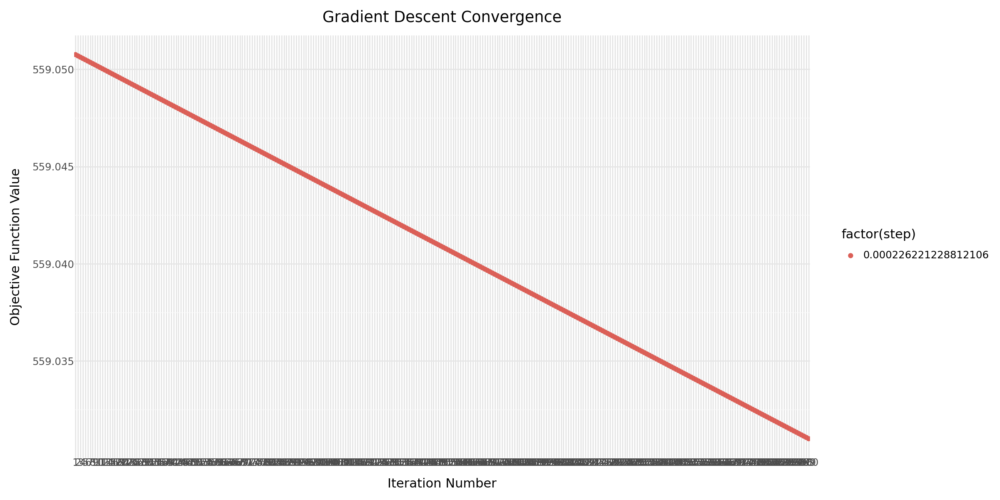

In [22]:
fig1 = (ggplot(all_objective_values, aes(x="iteration", y="objective_value", color="factor(step)")) +
       geom_point() +
       labs(title="Gradient Descent Convergence", x="Iteration Number", y="Objective Function Value") +
        # coord_cartesian(xlim=(0,5), ylim=(5, 10)) +
       theme_minimal() +
theme(figure_size=(12, 6)))
fig1

## Task2

In [21]:
def stochastic_calculate_objective(w):
    predictions = w[0] + X * w[1]
    loss = np.mean((Y - predictions) ** 2) / 2
    return loss

def stochastic_calculate_gradient(w):
    i = rd.randint(0, m - 1)
    prediction = w[0] + X[i] * w[1]
    error = prediction - Y[i]
    grad_w0 = error
    grad_w1 = error * X[i]
    return np.array([grad_w0, grad_w1]).flatten()

def stochastic_gradient_descent(step: float, error=1e-4, max_iter=10_000_000):
    x = np.array([0.0, 0.0])
    objective_values = []
    time_start = t.time()

    for i in range(max_iter):
        step = step/(1+i)
        grad = stochastic_calculate_gradient(x)
        next_x = x - step * grad
        # if i % 100 == 0:
        print(f"Iteration {i}, x = {x}")

        objective_values.append(stochastic_calculate_objective(next_x))
        if np.linalg.norm(grad) < error or np.linalg.norm(next_x) > 1e20:
            break
        x = next_x

    finish_time = t.time() - time_start
    return objective_values, finish_time, next_x

In [24]:
steps = [0.1]
all_objective_values_2 = pd.DataFrame(columns=['objective_value', 'iteration', 'step'])
for step in steps:
    objective_values, time, W = stochastic_gradient_descent(step, max_iter=500)
    print(
        f'for step {step} it took {time} and itterations: {len(objective_values)} for this final result {objective_values[-1]}')
    temp_df = pd.DataFrame({
        'objective_value': objective_values,
        'iteration': np.arange(1, len(objective_values) + 1),
        'step': str(step)
    })

    all_objective_values_2 = pd.concat([all_objective_values, temp_df], ignore_index=True)

w0_sto = W[0]
w1_sto = W[1]

Iteration 0, x = [0. 0.]
Iteration 1, x = [  17.53679699 1205.72127031]
Iteration 2, x = [  -4082.9764995  -278321.90537169]
Iteration 3, x = [  321262.09297964 22535458.7352545 ]
Iteration 4, x = [-6.16948385e+06 -4.26049318e+08]
Iteration 5, x = [1.67538589e+07 1.05367173e+09]
Iteration 6, x = [7.41160036e+06 4.57429478e+08]
Iteration 7, x = [6.88425589e+06 4.26797569e+08]
Iteration 8, x = [6.82165345e+06 4.23096198e+08]
Iteration 9, x = [6.81369516e+06 4.22553121e+08]
Iteration 10, x = [6.81291991e+06 4.22501521e+08]
Iteration 11, x = [6.81285386e+06 4.22497399e+08]
Iteration 12, x = [6.81284840e+06 4.22497061e+08]
Iteration 13, x = [6.81284792e+06 4.22497027e+08]
Iteration 14, x = [6.81284788e+06 4.22497025e+08]
Iteration 15, x = [6.81284788e+06 4.22497025e+08]
Iteration 16, x = [6.81284788e+06 4.22497025e+08]
Iteration 17, x = [6.81284788e+06 4.22497025e+08]
Iteration 18, x = [6.81284788e+06 4.22497025e+08]
Iteration 19, x = [6.81284788e+06 4.22497025e+08]
Iteration 20, x = [6.812

KeyboardInterrupt: 

## Task3


In [14]:
def calculate_objective_mae(w):
    predictions = w[0] + X * w[1]
    loss = np.mean(np.abs(Y - predictions))
    return loss

def subgradient_mae(w):
    e = Y - (w[0] + X * w[1])
    sgn_e = np.where(e > 0, 1, np.where(e < 0, -1, np.random.uniform(-1, 1, size=e.shape)))
    grad_w0 = -np.mean(sgn_e)
    grad_w1 = -np.mean(sgn_e * X)
    return np.array([grad_w0, grad_w1]).flatten()

def subgradient_mae_gradient_descent(initial_step: float, error=1e-4, max_iter=10_000_000):
    x = np.array([0.0, 0.0])
    objective_values = []
    time_start = t.time()
    for i in range(max_iter):
        step = initial_step/(1+i)
        grad = subgradient_mae(x)
        next_x = x - step * grad
        # if i % 10 == 0:
        print(f"Iteration {i}, x = {x}")

        objective_values.append(calculate_objective_mae(next_x))
        if np.linalg.norm(grad) < error or np.linalg.norm(next_x) > 1e20:
            break
        x = next_x

    finish_time = t.time() - time_start
    return objective_values, finish_time, next_x
def lipschitz_constant_mae(X):
    max_x = np.max(np.abs(X))
    L = np.sqrt(1 + max_x**2)
    return L

L_mae = lipschitz_constant_mae(X)


In [ ]:
steps = [0.5]
all_objective_values_3 = pd.DataFrame(columns=['objective_value', 'iteration', 'step'])
for step in steps:
    objective_values, time, W = subgradient_mae_gradient_descent(step, max_iter=100_000_000)
    print(
        f'for step {step} it took {time} and itterations: {len(objective_values)} for this final result {objective_values[-1]}')
    temp_df = pd.DataFrame({
        'objective_value': objective_values,mu
        'iteration': np.arange(1, len(objective_values) + 1),
        'step': str(step)
    })

    all_objective_values_3 = pd.concat([all_objective_values, temp_df], ignore_index=True)
w0_sub_mae = W[0]
w1_sub_mae = W[1]

Iteration 0, x = [0. 0.]
Iteration 1, x = [ 0.5        34.52538812]
Iteration 2, x = [ 0.25       17.26269406]
Iteration 3, x = [0.08333333 5.75423135]
Iteration 4, x = [-0.04166667 -2.87711568]
Iteration 5, x = [0.05833333 4.02796195]
Iteration 6, x = [-0.025      -1.72626941]
Iteration 7, x = [0.04642857 3.2059289 ]
Iteration 8, x = [-0.00925893 -0.65052178]
Iteration 9, x = [0.04629663 3.18563246]
Iteration 10, x = [0.00238663 0.14359748]
Iteration 11, x = [0.04784117 3.28226913]
Iteration 12, x = [0.00914951 0.60572604]
Iteration 13, x = [0.04761104 3.26152513]
Iteration 14, x = [0.01478962 0.99063383]
Iteration 15, x = [0.04812295 3.29232637]
Iteration 16, x = [0.01894795 1.27444403]
Iteration 17, x = [0.04835971 3.30534922]
Iteration 18, x = [0.02230416 1.50343325]
Iteration 19, x = [0.04861995 3.32055894]
Iteration 20, x = [0.02503495 1.68966395]
Iteration 21, x = [0.04884447 3.33373005]
Iteration 22, x = [0.02732629 1.84585709]
Iteration 23, x = [0.04906542 3.34696092]
Iteratio

## task 4


In [21]:
def stochastic_calculate_objective_mae(w):
    predictions = w[0] + X * w[1]
    loss = np.mean(np.abs(Y - predictions))
    return loss

def stochastic_subgradient_mae(w):
    i = rd.randint(0, m - 1)
    e = Y[i] - (w[0] + X[i] * w[1])
    sgn_e = np.sign(e)#np.where(e > 0, 1, np.where(e < 0, -1, np.random.uniform(-1, 1, size=e.shape)))
    grad_w0 = - sgn_e
    grad_w1 = -(sgn_e * X[i])
    return np.array([grad_w0, grad_w1]).flatten()

def stochastic_subgradient_descent_mae(step: float, error=1e-4, max_iter=10_000_000):
    x = np.array([0.0, 0.0])
    objective_values = []
    time_start = t.time()
    for i in range(max_iter):
        grad = stochastic_subgradient_mae(x)
        next_x = x - step * grad
        if i % 10 == 0:
            print(f"Iteration {i}, x = {x}")

        objective_values.append(stochastic_calculate_objective_mae(next_x))
        if np.linalg.norm(grad) < error or np.linalg.norm(next_x) > 1e20:
            break
        x = next_x

    finish_time = t.time() - time_start
    return objective_values, finish_time, next_x



In [78]:
steps = [1/L_mae]
all_objective_values_3 = pd.DataFrame(columns=['objective_value', 'iteration', 'step'])
for step in steps:
    objective_values, time, W = subgradient_mae_gradient_descent(step, max_iter=100)
    print(
        f'for step {step} it took {time} and itterations: {len(objective_values)} for this final result {objective_values[-1]}')
    temp_df = pd.DataFrame({
        'objective_value': objective_values,
        'iteration': np.arange(1, len(objective_values) + 1),
        'step': str(step)
    })

    all_objective_values_3 = pd.concat([all_objective_values, temp_df], ignore_index=True)


Iteration 0, x = [0. 0.]
Iteration 10, x = [0.03736702 2.41896704]
Iteration 20, x = [0.03861428 2.4189483 ]
Iteration 30, x = [0.03986152 2.41892983]
Iteration 40, x = [0.04110876 2.41891116]
Iteration 50, x = [0.04235598 2.41889248]
Iteration 60, x = [0.04360319 2.41887363]
Iteration 70, x = [0.04485039 2.41885498]
Iteration 80, x = [0.04609758 2.4188361 ]
Iteration 90, x = [0.04734476 2.41881744]


ValueError: too many values to unpack (expected 2)

In [79]:
w0_sto_mae = 0.04734476
w1_sto_mae = 2.41881744

## Graph


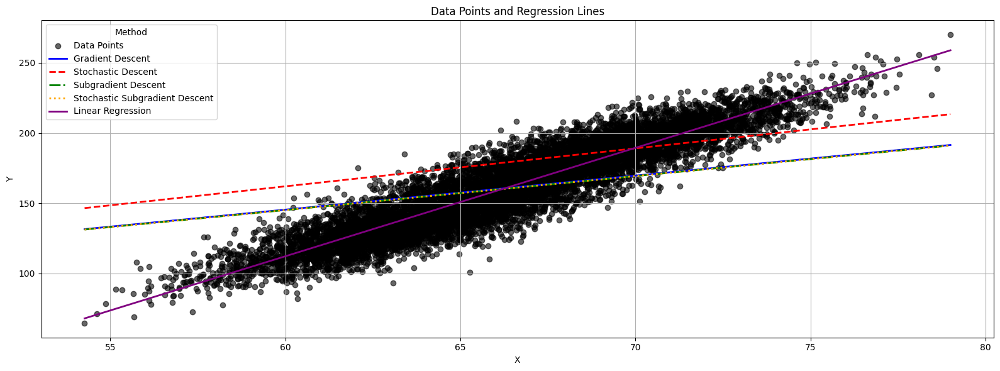

In [17]:
coeffs = [w0, w1, w0_sto, w1_sto, w0_sub_mae, w1_sub_mae, w0_sto_mae, w1_sto_mae, w0_lr, w1_lr]
coeffs = [0 if pd.isna(c) or c is None else c for c in coeffs]
w0, w1, w0_sto, w1_sto, w0_sub_mae, w1_sub_mae, w0_sto_mae, w1_sto_mae, w0_lr, w1_lr = coeffs

data_points = pd.DataFrame({"X": X.flatten(), "Y": Y.flatten()})

X_line = np.linspace(X.min(), X.max(), 100)
methods = [
    ("Gradient Descent", w0, w1),
    ("Stochastic Descent", w0_sto, w1_sto),
    ("Subgradient Descent", w0_sub_mae, w1_sub_mae),
    ("Stochastic Subgradient Descent", w0_sto_mae, w1_sto_mae),
    ("Linear Regression", w0_lr, w1_lr)
]

colors = ["blue", "red", "green", "orange", "purple"]
linestyles = ["-", "--", "-.", ":", "-"]

plt.figure(figsize=(16, 6))

plt.scatter(data_points["X"], data_points["Y"], color="black", alpha=0.6, label="Data Points")

for (method, w0_i, w1_i), color, ls in zip(methods, colors, linestyles):
    y_line = w0_i + w1_i * X_line
    plt.plot(X_line, y_line, label=method, color=color, linestyle=ls, linewidth=2)

plt.title("Data Points and Regression Lines")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend(title="Method")
plt.grid(True)
plt.tight_layout()
plt.show()





In [90]:
print("w0 =", w0, "w1 =", w1)
print("w0_sto =", w0_sto, "w1_sto =", w1_sto)
print("w0_sub_mae =", w0_sub_mae, "w1_sub_mae =", w1_sub_mae)
print("w0_sto_mae =", w0_sto_mae, "w1_sto_mae =", w1_sto_mae)



w0 = 0.07307422610627037 w1 = 2.423276384416853
w0_sto = -0.08161098588066885 w1_sto = 2.702586629421698
w0_sub_mae = 0.0485919209547384 w1_sub_mae = 2.4187986641481203
w0_sto_mae = 0.04734476 w1_sto_mae = 2.41881744


In [8]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X, Y)

w1_lr = lr.coef_[0]

w0_lr = lr.intercept_

w0 = 0.07307422610627037
w1 = 2.423276384416853

w0_sto = -0.08161098588066885
w1_sto = 2.702586629421698

w0_sub_mae = 0.0485919209547384
w1_sub_mae = 2.4187986641481203

w0_sto_mae = 0.04734476
w1_sto_mae = 2.41881744


In [9]:
w0_lr

-217.20127044144004

In [10]:
w1_lr

5.851469785418288